In [ ]:
from typing import List


class Solution:
    def is_palindrom(self,string):
        if len(string)<=1:
            return True
        i = 0
        while i<len(string)//2:
            if string[i]!=string[len(string)-1-i]:
                return False
            i+=1
        return True
            
    def rec_partition(self,s,limits):
        tuple_limits = tuple([tuple(x) for x in limits])
        if tuple_limits not in self.seen_limits:
            self.seen_limits.add(tuple_limits)
            partition = []
            is_palindrom_bool = True
            for limit in limits:
                string_ = s[limit[0]:limit[1]]
                partition.append(string_)
                if not self.is_palindrom(string_):
                   is_palindrom_bool = False
                   break
            if is_palindrom_bool:
                self.all_partitions.append(partition)
        else:
            return

        for i in range(1,len(limits)):
            from_ = limits[i-1][0]
            to_ = limits[i][1]
            new_limits = limits[:i-1]+[[from_,to_]] + limits[i+1:]
            self.rec_partition(s,new_limits)

    def partition(self, s: str) -> List[List[str]]:
        self.all_partitions = []
        self.seen_limits = set()
        limits = [[i,i+1] for i in range(len(s))]
        self.rec_partition(s,limits)
        return self.all_partitions



In [ ]:
solution = Solution()
solution.partition("ababbbabbaba")

In [ ]:
a = ((0, 1), (1, 2))+tuple([(3,4)])
a

In [ ]:
[[1,2],[3,4]]+[[4,5]]

In [ ]:
def is_palindrom(string):
    if len(string)<=1:
        return True
    i = 0
    while i<len(string)//2:
        if string[i]!=string[len(string)-1-i]:
            return False
        i+=1
    return True

is_palindrom("abba")

In [ ]:
class Solution:
    def compute_hash(self,str_,length):
        hash_ = 0
        for i in range(length):
            char = str_[i]
            hash_ += (ord(char) - 97)*(26)**(length-i-1)
        return hash_
    def strStr(self, haystack: str, needle: str) -> int:
        if len(needle)>len(haystack):
            return -1
        hash_needle = self.compute_hash(needle,len(needle))
        hash_haystack = self.compute_hash(haystack,len(needle))
        for i in range(len(haystack) - len(needle) + 1):
            if i>0:
                hash_haystack-=(ord(haystack[i-1]) - 97)*(26)**(len(needle)-1)
                hash_haystack*=26
                hash_haystack+=ord(haystack[i+len(needle)-1])-97
            if hash_needle==hash_haystack:
                for j in range(len(needle)):
                    if haystack[i+j]!=needle[j]:
                        break
                    if j==len(needle)-1:
                        return i
        return -1

In [ ]:
sol = Solution()
sol.strStr("hello","ll")

In [ ]:
"""
()(() open = 3 close = 2
()(() 
"""


class Solution:
    def longestValidParentheses(self, s: str) -> int:        
        n_open = 0
        n_close = 0
        for char in s:
            if char == "(":
                n_open+=1
            else:
                n_close+=1
        i = 0
        j = len(s)-1
        while i<=j:
            print(n_open)
            print(n_close)
            print(s[i:j+1])
            if s[i]==")":
                i+=1
                n_close-=1
            elif s[j]=="(":
                j-=1     
                n_open-=1
            else:
                if n_open == n_close:
                    print(s[i:j+1])
                    return n_open+n_close
                if n_open>n_close:
                    if s[i]=="(" and s[j]==")":
                        i+=1
                        n_open-=1
                    elif s[i]==")" and s[j]=="(":
                        j-=1
                        n_open-=1
                    elif s[i]=="(" and s[j]=="(":
                        i+=1
                        n_open-=1
                    elif s[i]==")" and s[j]==")":
                        i+=1
                        n_close-=1

                if n_close>n_open:
                    if s[i]==")" and s[j]=="(":
                        i+=1
                        n_close-=1
                    elif s[i]=="(" and s[j]==")":
                        j-=1
                        n_close-=1
                    elif s[i]==")" and s[j]==")":
                        i+=1
                        n_close-=1
                    elif s[i]=="(" and s[j]=="(":
                        j-=1
                        n_open-=1
        return 0

In [ ]:
solution = Solution()
solution.longestValidParentheses(")(())))(())())")

In [ ]:
from typing import List


class Solution:
    def jump(self, nums: List[int]) -> int:
        dins = [10**9 for i in range(len(nums))]
        dins[0] = 0
        for i in range(len(nums)):
            if dins[i]!=10**9:
                for j in range(1,nums[i]+1):
                    print("j",j)
                    if i+j<len(nums):
                        dins[i+j] = min(dins[i]+1,dins[i+j])
        print(dins)
        return dins[len(nums)-1]
            

In [ ]:
sol = Solution()
sol.jump([2,3,1,1,4])

In [ ]:
a = [1,2,3,4,5]
a.remove(2)
a

In [ ]:
class Solution:
    def recurs(self,n,current,remaining):
        print("current",current)
        print("remaining",remaining)
        if len(remaining) == 0:
            print("is_leaf")
            return 1
        smaller = []
        bigger = []
        for number in remaining:
            if number < current:
                smaller.append(number)
            else:
                bigger.append(number)
        total_left = 0
        total_right = 0
        for number in smaller:
            smaller_new = smaller.copy()
            smaller_new.remove(number)
            total_left+=self.recurs(n,number,smaller_new)
        for number in bigger:
            bigger_new = bigger.copy()
            bigger_new.remove(number)
            total_right+=self.recurs(n,number,bigger_new)
        print("current now",current)
        print("total_left",total_left)
        print("total_right",total_right)
        return max(total_left,1)*max(total_right,1)

    def numTrees(self, n: int) -> int:
        total = 0
        for num in range(n):
            total+=self.recurs(n,num+1,[i+1 for i in range(n) if i!=num])
        return total


sol = Solution()
sol.numTrees(3)

In [3]:
class Solution:
    def minInsertions(self, s: str) -> int:
        if len(s)==0:
            return
        current_candidates = [set() for i in range(len(s))]
        best = len(s)-1
        for i,let in enumerate(s):
            j = len(s)-1
            carrying_candidates = set([])
            while j>i:
                current_candidates_pos = current_candidates[j].copy()
                if s[j]==let:
                    current_candidates[j]=current_candidates[j].union(set([x+1 for x in carrying_candidates]))
                carrying_candidates=carrying_candidates.union(current_candidates_pos)
                if s[j]==let:
                    current_candidates[j].add(1)
                    if j>i+1:
                        best = min(best,len(s) - 2* max([x for x in current_candidates[j]]) - 1)
                    else:
                        best = min(best,len(s) - 2* max([x for x in current_candidates[j]]) )
                j-=1
        print(best)

solution = Solution()
solution.minInsertions("exnygefyhaixbcgntnzutvtzpklupehyuxxuyhepulkpztvtuzntngcbxiahyfegynxe")

let e
let x
let n
let y
let g
let e
let f
let y
let h
let a
let i
let x
let b
let c
let g
let n
let t
let n
let z
let u
let t
let v
let t
let z
let p
let k
let l
let u
let p
let e
let h
let y
let u
let x
let x
let u
let y
let h
let e
let p
let u
let l
let k
let p
let z
let t
let v
let t
let u
let z
let n
let t
let n
let g
let c
let b
let x
let i
let a
let h
let y
let f
let e
let g
let y
let n
let x
let e
0


In [16]:
class Solution:
    def minInsertions(self, s: str) -> int:
        if len(s)==0:
            return
        current_candidates = [0 for i in range(len(s))]
        best = len(s)-1
        for i,let in enumerate(s):
            j = len(s)-1
            carrying_candidates = 0
            while j>i:
                current_candidates_pos = current_candidates[j]
                if s[j]==let:
                    current_candidates[j]=max(current_candidates[j],carrying_candidates+1)
                carrying_candidates=max(carrying_candidates,current_candidates_pos)
                if s[j]==let:
                    current_candidates[j] = max(1,current_candidates[j])
                    if j>i+1:
                        best = min(best,len(s) - 2* current_candidates[j] - 1)
                    else:
                        best = min(best,len(s) - 2* current_candidates[j] )
                j-=1
        print(best)

solution = Solution()
solution.minInsertions("leetcode")

5


In [ ]:
class Solution:
    def minInsertions(self, s: str) -> int:
        if len(s)==0:
            return
        current_candidates = [set() for i in range(len(s))]
        best = len(s)-1
        for i,let in enumerate(s):
            j = len(s)-1
            carrying_candidates = set([])
            while j>i:
                current_candidates_pos = current_candidates[j].copy()
                if s[j]==let:
                    current_candidates[j]=current_candidates[j].union(set([x+1 for x in carrying_candidates]))
                carrying_candidates=carrying_candidates.union(current_candidates_pos)
                if s[j]==let:
                    current_candidates[j].add(1)
                    if j>i+1:
                        best = min(best,len(s) - 2* max([x for x in current_candidates[j]]) - 1)
                    else:
                        best = min(best,len(s) - 2* max([x for x in current_candidates[j]]) )
                j-=1
        print(best)

solution = Solution()
solution.minInsertions("exnygefyhaixbcgntnzutvtzpklupehyuxxuyhepulkpztvtuzntngcbxiahyfegynxe")

In [19]:
a = [1,2,3,4]
a.remove(3)

In [23]:
a = set([1,2,4])
a.remove(2)

In [24]:
a

{1, 4}

In [ ]:
class Solution:
    def trap(self, height: List[int]) -> int:
        maxes_so_far = []
        max_so_far = 0
        water_in_this_part = 0
        total_water = 0
        for h in height:
            if h<max_so_far:
                water_in_this_part+=(max_so_far-h)
            else:
                total_water+=water_in_this_part
                water_in_this_part = 0
                max_so_far = h
        return total_water

sol = Solution()
sol.trap()


In [33]:
from typing import List
class Solution:
    def trap(self, height: List[int]) -> int:
        max_lefts = []
        max_rights = []
        max_ = 0
        for h in height:
            max_lefts.append(max_)
            max_ = max(max_,h)
        max_ = 0
        rev_height = height.copy()
        rev_height.reverse()
        for h in rev_height:
            max_rights.append(max_)
            max_ = max(max_,h)
        max_rights.reverse()
        total_water = 0
        waters = []
        for i in range(len(height)):
            total_water += max(min(max_rights[i],max_lefts[i])-height[i],0)
        return total_water


sol = Solution()
sol.trap([4,2,0,3,2,5])


9

In [41]:
class Solution:
    def pivotArray(self, nums: List[int], pivot: int) -> List[int]:
        n_before = 0
        n_exact = 0
        n_after = 0
        for num in nums:
            if num == pivot:
                n_exact+=1
            elif num<pivot:
                n_before+=1
            else:
                n_after+=1
        current_i = 0
        i_before = 0
        i_exact = n_before
        i_after = n_before + n_exact
        for i in range(len(nums)):
            print(nums)
            num = nums[current_i]
            if num<pivot and current_i>=n_before:
                current_num = nums[i_before]
                nums[i_before] = num
                nums[current_i] = current_num
                i_before+=1
            elif num==pivot and (current_i<n_before or current_i>=n_before + n_exact):
                current_num = nums[i_exact]
                nums[i_exact] = num
                nums[current_i] = current_num
                i_exact+=1
            elif num>pivot and (current_i<n_before + n_exact):
                current_num = nums[i_after]
                nums[i_after] = num
                nums[current_i] = current_num
                i_after+=1
            else:
                current_i+=1
        return nums

In [42]:
sol = Solution()
sol.pivotArray([9,12,5,10,14,3,10],10)

[9, 12, 5, 10, 14, 3, 10]
[9, 12, 5, 10, 14, 3, 10]
[9, 3, 5, 10, 14, 12, 10]
[9, 3, 5, 10, 14, 12, 10]
[9, 3, 5, 10, 14, 12, 10]
[9, 3, 5, 10, 14, 12, 10]
[9, 3, 5, 10, 10, 12, 14]


[9, 3, 5, 10, 10, 12, 14]

In [147]:
class Solution:
    def binary_search(self,nums,target,left_ini,right_ini):
        if right_ini-left_ini==0:
            return nums[left_ini]==target
        left = left_ini
        right = right_ini
        while True:
            mid = (left + right)//2
            if nums[mid]==target or nums[left]==target or nums[right]==target:
                return True
            if mid==left and (right-left)==1:
                return False
            if nums[mid] > target:
                right = mid
            elif nums[mid] < target:
                left = mid

    def search(self, nums: List[int], target: int) -> bool:
        if len(nums)==0:
            return False
        if len(nums)==1:
            return nums[0] == target
        left = 0
        right = len(nums)-1
        while True:
            mid = (left + right)//2
            if mid==left or nums[mid-1]>nums[mid]:
                break
            if nums[left] >= nums[mid]:
                right = mid
            elif nums[right] <= nums[mid]:
                left = mid
        print(mid)
        return self.binary_search(nums,target,0,mid-1) or self.binary_search(nums,target,mid,len(nums)-1)

In [149]:
s = Solution()
s.search([1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1],0)

0


KeyboardInterrupt: 

In [144]:
s = Solution()
s.binary_search([0,1,1,1],0,0,3)

True

In [124]:
(3+2)//2

2

In [155]:
class Solution:
    def binary_search(self,nums,target,left_ini,right_ini):
        if right_ini-left_ini<0:
            return -1
        if right_ini-left_ini==0:
            return nums[left_ini]==target
        left = left_ini
        right = right_ini
        while True:
            mid = (left + right)//2
            if nums[mid]==target:
                return target
            if nums[left]==target:
                return left
            if nums[right]==target:
                return right                
            if mid==left and (right-left)==1:
                return -1
            if nums[mid] > target:
                right = mid
            elif nums[mid] < target:
                left = mid

    def search(self, nums: List[int], target: int) -> bool:
        if len(nums)==0:
            return -1
        if len(nums)==1:
            if nums[0] == target:
                return 0
            else:
                return -1
        if nums[len(nums)-1]>nums[0]:
            return self.binary_search(nums,target,0,len(nums)-1)
        left = 0
        right = len(nums)-1
        while True:
            mid = (left + right)//2
            if mid==left or nums[mid-1]>nums[mid]:
                break
            if nums[left] >= nums[mid]:
                right = mid
            elif nums[right] <= nums[mid]:
                left = mid
        print(mid)
        return max(self.binary_search(nums,target,0,mid-1), self.binary_search(nums,target,mid,len(nums)-1))

s = Solution()
s.search([1,3,5],3)

KeyboardInterrupt: 

In [161]:
def binary_search(nums,target,left,right):

    while left<=right:
        half = (left+right)//2
        if nums[half]==target:
            return half
        if nums[half]>target:
            right = half-1
        else:
            left = half + 1
    return -1 
array = [1,5,8,11,27,30]
binary_search(array,27,0,len(array)-1)


4

In [ ]:
from typing import List

class Solution:
    def maxProduct(nums):
        min_so_far = nums[0]
        cum_prod = nums[0]
        best_cum_prod = nums[0]
        for i in range(1,len(nums)):
            num = nums[i]
            cum_prod*=nums[i]
            min_so_far = min(min_so_far,cum_prod)
            best_cum_prod = max(cum_prod,best_cum_prod)
            if nums[i]==0:
                if 0>cum_prod:
                    best_cum_prod = 0
            else:
                best_cum_prod = max(cum_prod//nums[i],best_cum_prod)
        return best_cum_prod
    def maxProduct(self, nums: List[int]) -> int:
            return max(maxProduct([num for num in nums ]))
            #print(cum_prod)

        return best_cum_prod
            









sol = Solution()
sol.maxProduct([-1,2,3])


In [130]:
from typing import List

class Solution:
    def maxProduct(nums):
        min_so_far = nums[0]
        cum_prod = nums[0]
        best_cum_prod = nums[0]
        for i in range(1,len(nums)):
            num = nums[i]
            cum_prod*=nums[i]
            min_so_far = min(min_so_far,cum_prod)
            best_cum_prod = max(cum_prod,best_cum_prod)
            if nums[i]==0:
                if 0>cum_prod:
                    best_cum_prod = 0
            else:
                best_cum_prod = max(cum_prod//nums[i],best_cum_prod)
        return best_cum_prod
    def maxProduct(self, nums: List[int]) -> int:
            return max(maxProduct([num for num in nums ]))
            #print(cum_prod)

        return best_cum_prod
            









sol = Solution()
sol.maxProduct([-1,2,3])


-1

In [45]:
sum([1,2,-4,10])

9

In [260]:
class Solution:
    def maxProduct(self, nums: List[int]) -> int:
        min_cumprod_so_far = 1
        cumprod = 1
        max_cumprod =  max(nums)
        for i in range(len(nums)-1):
            cumprod *= nums[i]
            min_cumprod_so_far = min(min_cumprod_so_far,cumprod)
            print((min_cumprod_so_far))
            max_cumsum = max((cumprod*nums[i+1])//min_cumprod_so_far,max_cumprod)
            
        return max_cumsum

In [262]:
sol = Solution()
sol.maxProduct([-1,0,-4,-1])

-1
-1
-1


0

In [241]:
sol.maxSubArray([5,4,-1,7,8])

5
9
8
15


23

In [284]:
class Solution:
    def findMin(self, nums: List[int]) -> int:
        i = 0
        j = len(nums)-1
        while True:
            mid = (i+j)//2
            if (j-i)<=1:
                return min(nums[i],nums[j]) 
            if nums[mid]<nums[i]:
                j = mid 
            elif nums[mid]>nums[j]:
                i = mid
            else:
                return nums[0]

In [285]:
s = Solution()
s.findMin([1,2,3,4,5])

1

In [ ]:
"""
[3,4,5,1,2]
"""

i = 0
j = 4
mid = 2


i = 2
j = 4
mid = 3

j = 2
i = 3


In [300]:
from collections import defaultdict

class Solution:
    def threeSum(self, nums: List[int]) -> List[List[int]]:
        nums_with_pos = defaultdict(lambda : 0)
        for i,num in enumerate(nums):
            nums_with_pos[num]+=1
        all_triplets = set([])
        for num_1,c_1 in nums_with_pos.items():
            for num_2,c_2 in nums_with_pos.items():
                if num_1<=num_2:
                    num_3 = -(num_1+num_2)
                    if num_3>=num_2 and num_3 in nums_with_pos:
                        if (num_1!=num_2 or c_1>1) and (num_3!=num_2 or c_2>1) and (num_1!=0 and num_3!=0):
                            all_triplets.add(tuple([num_1,num_2,num_3]))
        print(nums_with_pos)
        if nums_with_pos[0]>=3:
            all_triplets.add(tuple([0,0,0]))
        return list([list(x) for x in all_triplets])
                    



       
s = Solution()
s.threeSum([-1,0,1,0])

defaultdict(<function Solution.threeSum.<locals>.<lambda> at 0x119df9040>, {-1: 1, 0: 2, 1: 1})


[[-1, 0, 1]]

In [ ]:
from collections import defaultdict

class Solution:
    def threeSum(self, nums: List[int]) -> List[List[int]]:
        nums_with_pos = defaultdict(lambda : 0)
        for i,num in enumerate(nums):
            nums_with_pos[num]+=1
        all_triplets = set([])
        for num_1,c_1 in nums_with_pos.items():
            for num_2,c_2 in nums_with_pos.items():
                if num_1<=num_2:
                    num_3 = -(num_1+num_2)
                    if num_3>=num_2 and num_3 in nums_with_pos:
                        if (num_1!=num_2 or c_1>1) and (num_3!=num_2 or c_2>1) and (num_1!=0 and num_3!=0):
                            all_triplets.add(tuple([num_1,num_2,num_3]))
        if nums_with_pos[0]>=3:
            all_triplets.add(tuple([0,0,0]))
        return list([list(x) for x in all_triplets])
                    



       
s = Solution()
s.threeSum([-1,0,1,0])

In [317]:
from collections import defaultdict

class Solution:
    def threeSum(self, nums: List[int]) -> List[List[int]]:
        nums = sorted(nums)
        triplets = set()
        for i in range(len(nums)-1):
            j = i+1
            k = len(nums)-1
            while True:
                if j==k:
                    break
                sum_ = nums[i]+ nums[j]+ nums[k]
                if sum_ == 0:
                    triplets.add(tuple([nums[i], nums[j],nums[k]]))
                    j+=1
                elif sum_ > 0:
                    k-=1
                else:
                    j+=1
        return list([list(x) for x in triplets])

                
                    



       
s = Solution()
s.threeSum([-2,0,1,1,2]
)

[[-2, 0, 2], [-2, 1, 1]]

In [334]:
class Solution:
    def coinChange(self, coins: List[int], amount: int) -> int:
        if amount == 0:
            return 0
        minimum_ways = [2**32 for i in range(amount+1)]
        for coin in coins:
            if coin <= amount:
                minimum_ways[coin]=1
        for i in range(len(minimum_ways)):
            print(i)
            print(minimum_ways)
            for coin in coins:
                ways = 2**32
                if i - coin>=0 and minimum_ways[i-coin]>0:
                    print("yes")
                    ways = min(ways,minimum_ways[i-coin]+1)
                    print(ways)
                    minimum_ways[i] = min(minimum_ways[i],ways)
            
        if minimum_ways[amount]==2**32:
            return -1
        else:
            return minimum_ways[amount]

In [335]:
sol = Solution()
sol.coinChange([1,2147483647],2)

0
[4294967296, 1, 4294967296]
1
[4294967296, 1, 4294967296]
yes
4294967296
2
[4294967296, 1, 4294967296]
yes
2


2

In [ ]:
class Node():
    def __init__(self,value):
        self.left = None
        self.right = None
    
    def add(self,value):
        if 

In [361]:
from queue import PriorityQueue

class Solution:
    def lengthOfLIS(self, nums: List[int]) -> int:
        best = 1
        ordered_nums = []
        for num in nums:
            if len(ordered_nums) == 0:
                ordered_nums.append([num,1])
            elif ordered_nums[len(ordered_nums)-1][0]<num:
                ordered_nums.append([num,ordered_nums[len(ordered_nums)-1][1]+1])
                best = max(best,ordered_nums[len(ordered_nums)-1][1])
            else:
                i = 0
                j = len(ordered_nums)-1
                while (j-i)>1:
                    mid = (j+i)//2
                    if ordered_nums[mid][0]<num:
                        i = mid
                    else:
                        j = mid
                ordered_nums[j] = [num,ordered_nums[j][1]]
                best = max(best,ordered_nums[j][1])
        return best
            

sol = Solution()
sol.lengthOfLIS([4,10,4,3,8,9])
                    





[[4, 1]]
[[4, 1], [10, 2]]
[[4, 1], [10, 2]]
[[3, 1], [10, 2]]
[[3, 1], [8, 2]]
[[3, 1], [8, 2], [9, 3]]


3

In [338]:
[1,5,6]
num = 5

i = 0
j = 3
mid = 1

i = 1
j = 3
mid = 2

j =2

In [341]:
3//2

1

In [ ]:
class Solution:
    def longestCommonSubsequence(self, text1: str, text2: str) -> int:
        text = text1
        positions = {}
        for i,letter in enumerate(text):
            if letter not in positions:
                positions[letter] = list()
            positions[letter].append(i)

        text = text2
        for letter in text2:
            

        


In [377]:
class Solution:
    def wordBreak(self, s: str, wordDict: List[str]) -> bool:
        wordDict = set(wordDict)
        indices = [False for i in range(len(s)+1)]
        indices[0] = True
        for i in range(len(s)):
            if indices[i] == False:
                continue
            current_word = ""
            for j,letter in enumerate(s):
                if j>=i:
                    current_word+=letter
                    if current_word in wordDict:
                        indices[j+1] = True
        print(indices)
        return indices[len(indices)-1] == True

sol = Solution()
sol.wordBreak("catsandog",["cats","dog","sand","and","cat"])




[True, False, False, True, True, False, False, True, False, False]


False

In [382]:
class Solution:
    def combinationSum4(self, nums: List[int], target: int) -> int:
        combs = [0 for i in range(target+1)]
        combs[0] = 1
        for i in range(len(combs)):
            for num in nums:
                if i - num >= 0:
                    combs[i] += combs[i - num]
        return combs[target]

        

sol = Solution()
sol.combinationSum4([9],3)

0

In [393]:
class Solution():
    def find_n_combs(self,number):
        if number <= 0:
            return 0
        if self.combs[number]!=-1:
            return self.combs[number]
        total = 0
        for num in self.nums:
            total+=self.find_n_combs(number-num)
        self.combs[number] = total
        return total
    def combinationSum4(self, nums: List[int], target: int) -> int:
        self.combs = [-1 for i in range(target+1)]
        self.nums = nums
        a= self.find_n_combs(target)
        print(self.combs)
        return a



In [396]:
sol = Solution()
sol.combinationSum4([1,2,3],4)

[-1, 1, 1, 1, 3]


3

In [397]:
class Solution:
    def rob(self, nums: List[int]) -> int:
        money_incl = [0 for i in range(len(nums))]
        money_excl = [0 for i in range(len(nums))]
        money_incl[0] = nums[0]
        money_incl[1] = nums[1]
        money_excl[1] = nums[0]
        max_money = 0
        for house in range(len(nums)):
            if house>=2:
                money_incl[house] = max(money_incl[house-2],money_excl[house-2]) + nums[house]
                money_incl[house] = max(money_incl[house],money_excl[house-1] + nums[house] )
                money_excl[house] = max(money_incl[house-2],money_excl[house-2])
                money_excl[house] = max(money_excl[house],money_incl[house-1])
                money_excl[house] = max(money_excl[house],money_excl[house-1])
            max_money = max(max_money,money_excl[house])
            max_money = max(max_money,money_incl[house])
        return max_money

In [400]:
sol = Solution()
sol.rob([2,7,9,3,1])

12

In [40]:
class Solution:
    def uniquePaths(self, m: int, n: int) -> int:
        n_ways = [[0 for i in range(n+1)] for j in range(m+1)]
        n_ways[1][1] = 1
        for i in range(1,max(m,n)+1):
            for j in range(1,max(m,n)+1):
                if i==j:
                    break
                if i<=m and j<=n:
                    n_ways[i][j] += n_ways[i][j-1] + n_ways[i-1][j]
                if i<=n and j<=m:
                    n_ways[j][i] += n_ways[j][i-1] + n_ways[j-1][i]
            if i<=n and i<=m:
                n_ways[i][i] += n_ways[i-1][i] + n_ways[i][i-1]
        return n_ways[m][n]
                

In [41]:
s = Solution()
sol = s.uniquePaths(3,7)

In [42]:
sol

28

In [57]:
from typing import List

class Solution:
    def largestRectangleArea_(self, heights: List[int]) -> int:
        print("hola")
        stack = []
        max_area = max(heights)
        for i,h in enumerate(heights):
            element = None
            while len(stack)>0:
                element = stack.pop()
                if element[0] <= h:
                    stack.append(element)
                    break
                else:
                    h_2 = element[0]
                    i_2 = element[1]
                    max_area = max(max_area,h_2*(i-i_2))
            
            stack.append([h,i])
            print(stack)

        while len(stack)>0:
            h_2,i_2 = stack.pop()
            max_area = max(max_area,h_2*(i-i_2+1))
        return max_area

    def largestRectangleArea(self, heights: List[int]):
        return max(self.largestRectangleArea_(heights),self.largestRectangleArea_(list(reversed(heights))))




s = Solution()
s.largestRectangleArea([2,4])

hola
[[2, 0]]
[[2, 0], [4, 1]]
hola
[[4, 0]]
[[2, 1]]


4

In [44]:
"""
[2,0]




"""

[4, 3, 2, 1]

In [60]:
def sort(arr):
    if len(arr)<=1:
        return arr

    left = sort(arr[:len(arr)//2])
    right = sort(arr[len(arr)//2:])
    sorted_array = []
    i = 0
    j = 0
    while i+j < len(arr):
        if i>=len(left):
            num = right[j]
            j+=1
        elif j>=len(right):
            num = left[i]
            i+=1
        else:
            if left[i]<=right[j]:
                num = left[i]
                i+=1
            else:
                num = right[j]
                j+=1
        sorted_array.append(num)
    return sorted_array
sort([10,0,100,2,5,1000])    

[0, 2, 5, 10, 100, 1000]

In [61]:
import threading

class Thread(threading.Thread):
    def __init__(self, t, *args):
        threading.Thread.__init__(self, target=t, args=args)
        self.start()
count = 0
lock = threading.Lock()

def increment():
    global count 
    lock.acquire()
    try:
        count += 1    
    finally:
        lock.release()
   
def bye():
    while True:
        increment()
        
def hello_there():
    while True:
        increment()

def main():    
    hello = Thread(hello_there)
    goodbye = Thread(bye)
    
    while True:
        print (count)

if __name__ == '__main__':
    main()

41972
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
41978
4197

KeyboardInterrupt: 

In [64]:
import threading
import time
import inspect

class Thread(threading.Thread):
    def __init__(self, t, *args):
        threading.Thread.__init__(self, target=t, args=args)
        self.start()

count = 0
lock = threading.Lock()

def incre(caller):
    global count
    print ("Inside %s()" % caller)
    print ("Acquiring lock")
    with lock:
        print ("Lock Acquired")
        count += 1  
        time.sleep(2)  

def bye():
    while count < 5:
        incre("bye")

def hello_there():
    while count < 5:
        incre("hello")

def main():    
    hello = Thread(hello_there)
    goodbye = Thread(bye)


if __name__ == '__main__':
    main()

Inside hello()
Acquiring lock
Lock Acquired
Inside bye()
Acquiring lock


Inside bye()Lock Acquired

Acquiring lock
Inside hello()Lock Acquired

Acquiring lock
Inside hello()
Acquiring lock
Inside bye()
Acquiring lock
Lock Acquired
Inside bye()Lock Acquired

Acquiring lock
Lock Acquired
Lock Acquired
Lock Acquired


In [4]:
import time
import inspect
import queue
import threading

class Thread(threading.Thread):
    def __init__(self, t, *args):
        threading.Thread.__init__(self, target=t, args=args)
        self.start()

def fizz():
    print("fizz")

def buzz():
    print("buzz")

def fizzbuzz():
    print("fizzbuzz")

def printNumber(j):
    print(j)

i = 1

class FizzBuzz:
    def __init__(self, n: int):
        
        self.n = n

    # printFizz() outputs "fizz"
    def fizz(self, printFizz: 'Callable[[], None]') -> None:
        global i
        while i!=self.n+1:
            if i%3==0 and i%5!=0:
                printFizz()  
                i+=1    	

    # printBuzz() outputs "buzz"
    def buzz(self, printBuzz: 'Callable[[], None]') -> None:
        global i
        while i!=self.n+1:
            if i%3!=0 and i%5==0:
                printBuzz()  
                i+=1  

    # printFizzBuzz() outputs "fizzbuzz"
    def fizzbuzz(self, printFizzBuzz: 'Callable[[], None]') -> None:
        global i
        while i!=self.n+1:
            if i%3==0 and i%5==0:
                printFizzBuzz()  
                i+=1

    # printNumber(x) outputs "x", where x is an integer.
    def number(self, printNumber: 'Callable[[int], None]') -> None:
        global i
        while i!=self.n+1:
            if i%3!=0 and i%5!=0:
                printNumber(i) 
                i+=1


   
if __name__ == '__main__':
    n = 15
    fz = FizzBuzz(n)
    Thread(fz.number,printNumber)
    Thread(fz.fizz,fizz)
    Thread(fz.buzz(buzz))
    Thread(fz.fizzbuzz(fizzbuzz))


11
2
fizz
4
buzz
fizz
7
8
fizz
buzz
11
fizz
13
14



In [1]:
1+1

2

In [89]:
import logging
import threading
import time
import concurrent.futures


def thread_function(name):
    logging.info("Thread %s: starting", name)
    time.sleep(2)
    logging.info("Thread %s: finishing", name)

if __name__ == "__main__":
    format = "%(asctime)s: %(message)s"
    logging.basicConfig(format=format, level=logging.INFO,
                        datefmt="%H:%M:%S")

    with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
        executor.map(thread_function, range(5))

19:32:41: Thread 0: starting
19:32:41: Thread 1: starting
19:32:41: Thread 2: starting
19:32:41: Thread 3: starting
19:32:41: Thread 4: starting
19:32:43: Thread 1: finishing
19:32:43: Thread 0: finishing
19:32:43: Thread 2: finishing
19:32:43: Thread 4: finishing
19:32:43: Thread 3: finishing


In [145]:
class FakeDatabase:
    def __init__(self):
        self.value = 0
        self._lock = threading.Lock()

    def locked_update(self, name):
        logging.info("Thread %s: starting update", name)
        logging.debug("Thread %s about to lock", name)
        with self._lock:
            logging.debug("Thread %s has lock", name)
            local_copy = self.value
            local_copy += 1
            time.sleep(0.1)
            self.value = local_copy
            logging.debug("Thread %s about to release lock", name)
        logging.debug("Thread %s after release", name)
        logging.info("Thread %s: finishing update", name)
        

if __name__ == "__main__":
    format = "%(asctime)s: %(message)s"
    logging.basicConfig(format=format, level=logging.INFO,
                        datefmt="%H:%M:%S")

    database = FakeDatabase()
    logging.info("Testing update. Starting value is %d.", database.value)
    with concurrent.futures.ThreadPoolExecutor(max_workers=3) as executor:
        for index in range(2):
            executor.submit(database.locked_update, index)
    logging.info("Testing update. Ending value is %d.", database.value)

    

19:53:15: Testing update. Starting value is 0.
19:53:15: Thread 0: starting update
19:53:15: Thread 1: starting update
19:53:15: Thread 0: finishing update
19:53:15: Thread 1: finishing update
19:53:15: Testing update. Ending value is 2.


In [170]:
pipeline = Pipeline()

NameError: name 'Pipeline' is not defined

In [172]:
event = threading.Event()
event.

In [8]:
intervals = [[1,2],[3,4],[5,6]]
intervals.insert(1,[0,1])

In [11]:
intervals.delete(1)

AttributeError: 'list' object has no attribute 'delete'

In [12]:
del intervals[0]

In [79]:
from typing import List

class Solution:
    def largestRectangleArea_(self, heights: List[int], reverse = False) -> int:
        stack = []
        areas = heights.copy()
        for i,h in enumerate(heights):
            element = None
            while len(stack)>0:
                element = stack.pop()
                if element[0] <= h:
                    stack.append(element)
                    break
                else:
                    h_2 = element[0]
                    i_2 = element[1]
                    areas[i_2] = max(areas[i_2],h_2*(i-i_2))            
            stack.append([h,i])

        while len(stack)>0:
            h_2,i_2 = stack.pop()
            areas[i_2] = max(areas[i_2],h_2*(i-i_2+1))
        return areas

    def largestRectangleArea(self, heights: List[int]):
        areas_right = self.largestRectangleArea_(heights)
        areas_left = list(reversed(self.largestRectangleArea_(list(reversed(heights)))))
        print(areas_right)
        print(areas_left)
        max_area = [areas_right[i]+ areas_left[i]-heights[i] for i in range(len(heights))]
        return max(max_area)

In [80]:
s = Solution()
s.largestRectangleArea([2,0,2])

[2, 0, 2]
[2, 0, 2]
[2, 2, 2]
[2, 2, 2]


4

In [30]:
list(reversed([1,2,3]))

[3, 2, 1]

In [83]:
import time
import inspect
import queue
import threading

class Thread(threading.Thread):
    def __init__(self, t, *args):
        threading.Thread.__init__(self, target=t, args=args)
        self.start()
    
class NumberedThread():
    def __init__(self):
        self.central_lock = threading.Lock()
        self.atomic_variable = 9

    def try_print(self,n):
        while True:
            if self.atomic_variable==n:
                print(n)
                self.atomic_variable-=1
                break
n = 10
numberedThread = NumberedThread()
for i in range(n):
    thread = threading.Thread(numberedThread.try_print(i))

KeyboardInterrupt: 

In [84]:
import numpy as np

ModuleNotFoundError: No module named 'numpy'

In [126]:
from collections import defaultdict
from typing import List
class Solution:
    def canFinish(self, numCourses: int, prerequisites: List[List[int]]) -> bool:
        graph = {i:[] for i in range(numCourses)}
        for prereq in prerequisites:
            graph[prereq[1]].append(prereq[0])
        seen = set()
        for i in range(numCourses):
            stack = [i]
            visited = set()
            while stack:
                course = stack.pop()
                if course in seen: 
                    if course in visited:
                        return False
                    continue
                seen.add(course)
                visited.add(course)
                for neigh in graph[course]:
                    stack.append(neigh)
        return True

In [135]:
from collections import defaultdict
from typing import List
class Solution:
    def has_loop(self,course_num,graph):
        if course_num in self.seen:
            if self.visited[course_num]:
                return True
            return False
        self.seen.add(course_num)
        self.visited[course_num] = True
        has_loop_var = False
        for neigh in graph[course_num]:
            has_loop_var = has_loop_var or self.has_loop(neigh,graph)
        self.visited[course_num] = False
        return has_loop_var

    def canFinish(self, numCourses: int, prerequisites: List[List[int]]) -> bool:
        graph = {i:[] for i in range(numCourses)}
        for prereq in prerequisites:
            graph[prereq[1]].append(prereq[0])
        self.seen = set()
        self.visited = [False for i in range(numCourses)]
        for i in range(numCourses):
            if self.has_loop(i,graph)==True:
                return False

        return True

In [136]:
sol = Solution()
sol.canFinish(4,[[1,0],[2,0],[3,1],[3,2]])

True

In [143]:
from collections import defaultdict
from typing import List
class Solution:
    def canFinish(self, numCourses: int, prerequisites: List[List[int]]) -> bool:
        graph = {i:[] for i in range(numCourses)}
        n_inbound_edges = [0 for i in range(numCourses)]
        nodes_0_inbound_edges = set([i for i in range(numCourses)])
        for prereq in prerequisites:
            graph[prereq[1]].append(prereq[0])
            n_inbound_edges[prereq[0]]+=1
            if prereq[0] in nodes_0_inbound_edges:
                nodes_0_inbound_edges.remove(prereq[0])
        stack = list(nodes_0_inbound_edges)
        seen = set()
        while stack:
            element = stack.pop()
            if element not in seen:
                seen.add(element)
            else:
                continue
            for neigh in graph[element]:
                n_inbound_edges[neigh]-=1
                if n_inbound_edges[neigh]==0:
                    stack.append(neigh)
                    nodes_0_inbound_edges.add(neigh)
        return len(nodes_0_inbound_edges) == numCourses

In [144]:
sol = Solution()
sol.canFinish(4,[[1,0],[2,0],[3,1],[3,2]])

True

In [225]:
from collections import deque

class Solution:
    def can_flow_to_ocean(self,heights,ocean):
        can_flow = [[False for i in range(len(heights[0]))] for j in range(len(heights))]
        queue = deque()
        seen = set()
        for i in range(len(can_flow)):
            if ocean == "pacific":
                idx_0 = i
                idx_1 = 0

            else:
                idx_0 = i
                idx_1 = len(can_flow[0])-1
            
            queue.append([idx_0,idx_1])
            can_flow[idx_0][idx_1] = True

        for i in range(len(can_flow[0])):
            if ocean == "pacific":
                idx_0 = 0
                idx_1 = i
            else:
                idx_0 = len(can_flow)-1
                idx_1 = i
            queue.append([idx_0,idx_1])
            can_flow[idx_0][idx_1] = True
        neigh_dirs = [[1,0],[-1,0],[0,1],[0,-1]]
        while queue:
            element = queue.popleft()
            if tuple(element) in seen:
                continue
            can_flow[element[0]][element[1]] = True
            seen.add(tuple(element))
            for neigh_dir in neigh_dirs:
                neigh = [element[0]+neigh_dir[0],element[1]+neigh_dir[1]]
                if neigh[0]>=0 and neigh[0]<len(can_flow) and neigh[1]>=0 and neigh[1]<len(can_flow[0]):
                    if heights[neigh[0]][neigh[1]]>=heights[element[0]][element[1]]:
                        queue.append(neigh)
        return can_flow

    def pacificAtlantic(self, heights: List[List[int]]) -> List[List[int]]:
        can_flow_pac = self.can_flow_to_ocean(heights,"pacific")
        can_flow_at = self.can_flow_to_ocean(heights,"atlantic")
        result = []
        for i in range(len(heights)):
            for j in range(len(heights[0])):
                if can_flow_pac[i][j] and can_flow_at[i][j]:
                    result.append([i,j])
        return result


In [226]:
sol = Solution()
sol.pacificAtlantic([[1,2,2,3,5],[3,2,3,4,4],[2,4,5,3,1],[6,7,1,4,5],[5,1,1,2,4]])

[[0, 4], [1, 3], [1, 4], [2, 2], [3, 0], [3, 1], [4, 0]]

In [210]:
array = [[1,2,2,3,5],[3,2,3,4,4],[2,4,5,3,1],[6,7,1,4,5],[5,1,1,2,4]]
array[3][0]

6

In [207]:
1+1

2

In [150]:
from collections import deque

queue = deque()
queue.append(1)
queue.append(2)



In [151]:
queue.popleft()

1

In [ ]:
import requests


In [13]:
from typing import List

class Solution:
    def check_solution(self,k,n,ribbons):
        n_cuts = 0
        for ribbon in ribbons:
            if ribbon>=n:
                n_cuts+=ribbon//n
            else:
                break
        return n_cuts>=k

    def maxLength(self, ribbons: List[int], k: int) -> int:
        ribbons = sorted(ribbons,reverse=True)
        check_1 = self.check_solution(k,1,ribbons)
        if not check_1:
            return 0
        check_n = self.check_solution(k,ribbons[0],ribbons)
        if check_n:
            return ribbons[0]
        i = 1
        j = ribbons[0]
        while j-i>1:
            mid = (i+j)//2
            check = self.check_solution(k,mid,ribbons)
            if check:
                i = mid
            else:
                j = mid
        if self.check_solution(k,j,ribbons):
            return j
        return i

In [16]:
sol = Solution()
sol.maxLength([7,5,9],4)

4

In [27]:
current_node_id =4
current_depth =0
depth = 5
current_current = 2*current_node_id
for i in range(current_depth+1,depth):
    current_current = current_current*(2)+1

In [33]:
2*current_node_id*(2**(depth-current_depth-1))+2**(depth-current_depth-1) -1

143

In [31]:
current_current

143

In [29]:
2**(5-0)

32

In [34]:
max([])

ValueError: max() arg is an empty sequence

In [43]:
class Solution:
    def dfs(self,element):
        if self.longest_so_far[element[0]][element[1]]!=-1:
            return self.longest_so_far[element[0]][element[1]]
        movements = [[0,1],[1,0],[0,-1],[-1,0]]
        length_elements = [0]
        for movement in movements:
            if element[0]+movement[0]>=0 and element[0]+movement[0]<len(self.matrix):
                if element[1]+movement[1]>=0 and element[1]+movement[1]<len(self.matrix[0]):
                    if self.matrix[element[0]+movement[0]][element[1]+movement[1]]>self.matrix[element[0]][element[1]]:
                        length_elements.append(self.dfs([element[0]+movement[0],element[1]+movement[1]]))
        self.longest_so_far[element[0]][element[1]] = max(length_elements)+1
        self.length_longest_path = max(self.length_longest_path,self.longest_so_far[element[0]][element[1]])
        return self.longest_so_far[element[0]][element[1]]
                    


    def longestIncreasingPath(self, matrix: List[List[int]]) -> int:
        self.matrix = matrix
        self.longest_so_far = [[-1 for i in range(len(matrix[0]))] for j in range(len(matrix))]
        self.length_longest_path = 0
        for i in range(len(matrix)):
            for j in range(len(matrix[0])):
                self.dfs([i,j])
        return self.longest_so_far

In [44]:
s = Solution()
a = s.longestIncreasingPath([[9,9,4],[6,6,8],[2,1,1]])
print(a)

[[1, 1, 2], [2, 2, 1], [3, 4, 2]]


In [46]:
array_sample = list(np.random.randint(0,20,10))
array_sample

[1, 4, 2, 6, 12, 1, 19, 0, 3, 6]

In [61]:
import numpy as np

def swap(array,i,j):
    swp = array[i]
    array[i] = array[j]
    array[j] = swp
    return array

def quick_sort(array):
    if len(array)<=1:
        return array
    if len(array)==2:
        if array[0]>array[1]:
            array = swap(array,0,1)
        return array
    pivot_ind = len(array)-1
    i = 0
    j = len(array)-2
    while i<j:
        if array[i]>array[pivot_ind] and array[j]<array[pivot_ind]:
            array = swap(array,i,j)
            continue
        if array[i]<=array[pivot_ind]:
            i+=1
        if array[j]>=array[pivot_ind]:
            j-=1
    if array[pivot_ind]<array[j]:
        array = swap(array,pivot_ind,j)
        pivot_ind = j
    elif array[pivot_ind]<array[i]:
        array = swap(array,pivot_ind,i)
        pivot_ind = i
    
    return quick_sort(array[:pivot_ind]) + [array[pivot_ind]] + quick_sort(array[pivot_ind+1:])
    #return array
    


quick_sort(array_sample)


[0, 1, 1, 2, 3, 6, 4, 6, 12, 19]

In [21]:
import numpy as np

def swap(array,i,j):
    swp = array[i]
    array[i] = array[j]
    array[j] = swp
    return array

def quick_sort(array):
    if len(array)<=1:
        return array
    if len(array)==2:
        if array[0]>array[1]:
            array = swap(array,0,1)
        return array
    pivot_ind = len(array)-1
    i = 0
    j = len(array)-2
    while i<j:
        if array[i]>=array[pivot_ind] and array[j]<array[pivot_ind]:
            array = swap(array,i,j)
            continue
        if array[i]<array[pivot_ind]:
            i+=1
        if array[j]>=array[pivot_ind]:
            j-=1
    if array[pivot_ind]<=array[j]:
        array = swap(array,pivot_ind,j)
        pivot_ind = j
    array[pivot_ind]<=array[i]:
        array = swap(array,pivot_ind,i)
        pivot_ind = i
    after = quick_sort(array[:pivot_ind]) + [array[pivot_ind]] + quick_sort(array[pivot_ind+1:])
    return after
    


sorted_by_me = quick_sort(array)
sorted_by_python = sorted(array)
sorted_by_me==sorted_by_python


SyntaxError: invalid syntax (2698389550.py, line 30)

In [20]:
for i in range(len(sorted_by_me)):
    if sorted_by_me[i]!=sorted_by_python[i]:
        break
print(i)

15


In [14]:
sorted_by_me[:16]

[8, 35, 49, 80, 100, 111, 135, 144, 147, 156, 173, 176, 177, 194, 204, 242]

In [15]:
sorted_by_python[:16]

[8, 35, 49, 80, 100, 111, 135, 144, 147, 156, 173, 176, 177, 194, 204, 233]

In [25]:
n = 4000
m = 4000
list_ = list(np.random.randint(0,10,n*(m+1)))

In [31]:
%%timeit 10

sum = 0
for i in range(4000):
    for j in range(4000):
        sum+=list_[i*4000+j]


2.39 s ± 94.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [32]:
%%timeit 10

sum = 0
for i in range(4000):
    for j in range(4000):
        sum+=list_[i+4000*j]


3.32 s ± 276 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [36]:
from typing import List

class Solution:
    def peakIndexInMountainArray(self, arr: List[int]) -> int:
        i = 0
        j = len(arr)-1
        while True:
            if j-i<=1:
                break
            med = (i+j)//2
            print("yey")
            print(med)
            print(arr[med])
            if arr[med]>arr[i]:
                i = med
            else:
                j = med
        if arr[i]>arr[j]:
            return i
        return j

s = Solution()
s.peakIndexInMountainArray([24,69,100,99,79,78,67,36,26,19])

yey
4
79
yey
6
67
yey
5
78


4

<module 'numpy' from '/Users/donguille/Library/Python/3.7/lib/python/site-packages/numpy/__init__.py'>

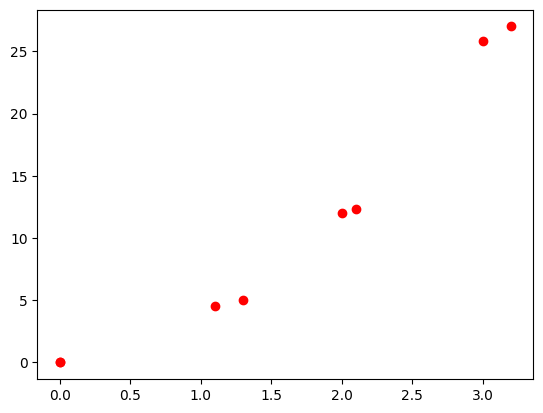

In [62]:
import matplotlib.pyplot as plt
import numpy as np

t = np.asarray([0,1.1,2,3.2,0,1.3,2.1,3])
P = [0,4.5,12,27,0,5,12.3,25.8]

plt.scatter(t,P,color = "red")

np

In [50]:
from statsmodels.regression import linear_model

model = linear_model.OLS(endog = P, exog = np.vstack([t,t**2]).T)
results = model.fit()

In [58]:
t_new = np.arange(0,4,0.1)
t_new_ = np.vstack([t_new,t_new**2]).T
p_new = results.predict(t_new_)

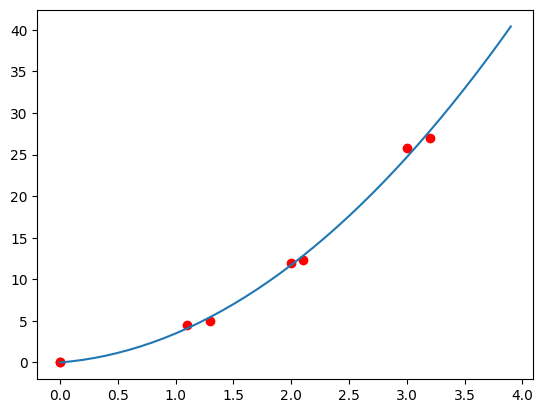

In [61]:
plt.plot(t_new,p_new)
plt.scatter(t,P,color = "red")

In [66]:
results.params

array([1.11643078, 2.37065729])

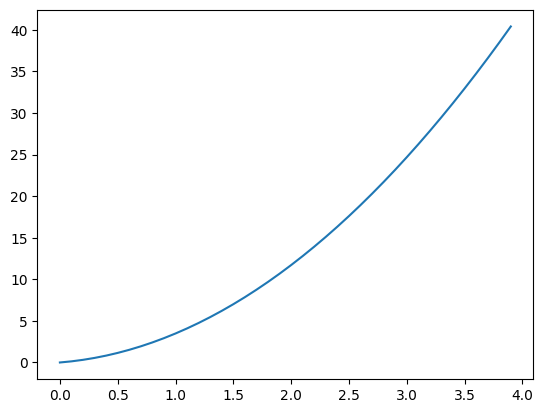

In [67]:
t_new = np.arange(0,4,0.1)
p = t_new**2*0.008+0.192*t_new
plt.plot(t_new,p_new)


In [68]:
a = set([1,2,3])
a.remove(1)

In [69]:
a

{2, 3}

In [70]:
5^5

0

In [71]:
5^6

3

In [73]:
5^0

5

In [74]:
from collections import Counter

In [77]:
Counter(["hola","hola","adios"]).keys()

dict_keys(['hola', 'adios'])

In [79]:
a = [1,2,3,4]
a+[4]*0

[1, 2, 3, 4]

In [83]:

from collections import Counter
from typing import List

class Solution:

    def recursion(self,current,pos):
        if pos==len(self.count_keys):
            self.all_sets.append(current)
            return

        for n in range(self.count_values[pos]+1):
            new_current = current.copy()
            new_current+=[self.count_keys[pos]]*n
            self.recursion(new_current,pos+1)

    def subsetsWithDup(self, nums: List[int]) -> List[List[int]]:
        count_dict = Counter(nums)
        self.count_keys = list(count_dict.keys())
        self.count_values = list(count_dict.values())
        self.all_sets = []
        self.nums = nums
        self.recursion([],0)
        return self.all_sets


sol = Solution()
sol.subsetsWithDup([1,2,2])

[[], [2], [2, 2], [1], [1, 2], [1, 2, 2]]

In [94]:

class Account:
    def __init__(self,email,name):
        self.email = email
        self.parent = None
        self.name = name

    def union(self,parent):
        if self.parent is None:
            self.parent = parent
        else:
            self.parent.union(parent)
            self.parent = parent

    def find(self):
        if self.parent is None:
            return self
        parent = self.parent.find()
        self.parent = parent
        return parent

class Solution:
    def accountsMerge(self, accounts: List[List[str]]) -> List[List[str]]:
        emails_of_accounts = {}
        for i,accounts in enumerate(accounts):
            name = accounts[0]
            accounts_to_join = []
            for j,email in enumerate(accounts[1:]):
                account = Account(email,name)
                if j==0:
                    parent = account
                else:
                    account.parent = parent
                if email in emails_of_accounts:
                    emails_of_accounts[email].union(parent)
                emails_of_accounts[email] = account
        return emails_of_accounts
        groups = {}
        for email in emails_of_accounts:
            account = emails_of_accounts[email]
            parent = account.find()
            if parent.email not in groups:
                groups[parent.email] = [parent.name,set()]
            groups[parent.email][1].add(account.email)
        accounts = []
        for group in groups.values():
            account = [group[0]]
            account+=sorted(list(group[1]))
            accounts.append(account)
        return accounts

In [95]:
sol = Solution()
emails = sol.accountsMerge([["Alex","Alex5@m.co","Alex4@m.co","Alex0@m.co"],["Ethan","Ethan3@m.co","Ethan3@m.co","Ethan0@m.co"],["Kevin","Kevin4@m.co","Kevin2@m.co","Kevin2@m.co"],["Gabe","Gabe0@m.co","Gabe3@m.co","Gabe2@m.co"],["Gabe","Gabe3@m.co","Gabe4@m.co","Gabe2@m.co"]])

In [101]:
emails["Gabe3@m.co"].parent

In [102]:
emails["Gabe3@m.co"]

In [104]:
a  = set([1,2,3])
a = a.union(set([3,4]))

In [105]:
a

{1, 2, 3, 4}

In [140]:

class Solution:
    def accountsMerge(self, accounts: List[List[str]]) -> List[List[str]]:
        emails_of_accounts = {}
        graph = {}
        for i,account in enumerate(accounts):
            name = account[0]
            graph[i] = set()
            for email in account[1:]:
                if email in emails_of_accounts:
                    graph[i].add(emails_of_accounts[email])
                    graph[emails_of_accounts[email]].add(i)
                else:
                    emails_of_accounts[email] = i
        seen = set()
        result = []
        print(graph)
        for c_i in graph:
            stack = [c_i]
            emails = set()
            while len(stack):
                element = stack.pop()
                if element in seen:
                    continue
                seen.add(element)
                emails = emails.union(accounts[element][1:])
                for c_j in graph[element]:
                    stack.append(c_j)
            if len(emails)>0:
                result.append([accounts[c_i][0]]+sorted(list(emails)))
        return result

In [141]:
sol = Solution()
sol.accountsMerge([["David","David0@m.co","David1@m.co"],["David","David3@m.co","David4@m.co"],["David","David4@m.co","David5@m.co"],["David","David2@m.co","David3@m.co"],["David","David1@m.co","David2@m.co"]])

{0: {4}, 1: {2, 3}, 2: {1}, 3: {1, 4}, 4: {0, 3}}


[['David',
  'David0@m.co',
  'David1@m.co',
  'David2@m.co',
  'David3@m.co',
  'David4@m.co',
  'David5@m.co']]

In [1]:
edges = [[1,6],[6,8],[4,10]]

In [3]:
sorted(edges,reverse=True)

[[6, 8], [4, 10], [1, 6]]

In [5]:
from collections import defaultdict
from typing import List

class Solution:
    def max_height_node(self,node_id,current_max_height,node_from):
        if current_max_height<=self.max_height[node_id]:
            return self.max_height[node_id]
        current_heights = []
        if node_from!=-1:
            current_heights.append([current_max_height,node_from])
        for node_id_neigh in self.edges[node_id]:
            if node_id_neigh!=node_from:
                current_height = self.max_height_node(node_id_neigh,0,node_id)+1
                current_heights.append([current_height,node_id_neigh])
        print("Yey")
        print(node_id)
        current_heights = sorted(current_heights,reverse = True)
        print(current_heights)

        self.max_height[node_id] = current_heights[0][0]
        for node_id_neigh in self.edges[node_id]:
            if node_id_neigh!=current_heights[0][1]:
                self.max_height_node(node_id_neigh,current_heights[0][0]+1,node_id)
            else:
                if len(current_heights)>1:
                    self.max_height_node(node_id_neigh,current_heights[1][0]+1,node_id)
        return self.max_height[node_id]

    def findMinHeightTrees(self, n: int, edges: List[List[int]]) -> List[int]:
        self.edges = defaultdict(lambda:[])
        self.max_height = [-1 for i in range(n)]
        for node_1,node_2 in edges:
            self.edges[node_1].append(node_2)
            self.edges[node_2].append(node_1)
        self.max_height_node(0,0,-1)
        min_height = min(self.max_height)
        print(self.max_height)
        return [i for i in range(n) if self.max_height[i]==min_height]



sol = Solution()
sol.findMinHeightTrees(6,[[3,0],[3,1],[3,2],[3,4],[5,4]])

[4, 4, 4, 3, 2, 3]


[4]